# Reference
https://kikaben.com/yolov5-transfer-learning-dogs-cats/ <br>
https://www.kaggle.com/code/stopwhispering/cats-and-dogs-yolov5-transfer-learning-obj-det

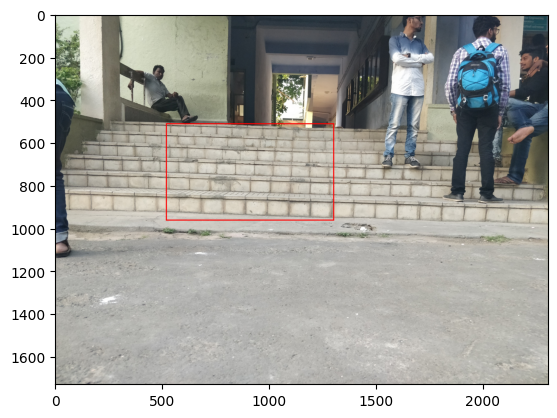

In [2]:
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt 

def show_bbox(image_path):
    # convert image path to label path
    label_path = image_path.replace('/images/', '/darknet/')
    label_path = label_path.replace('.jpg', '.txt')

    # Open the image and create ImageDraw object for drawing
    image = Image.open(image_path)
    draw = ImageDraw.Draw(image)

    with open(label_path, 'r') as f:
        for line in f.readlines():
            # Split the line into five values
            label, x, y, w, h = line.split(' ')

            # Convert string into float
            x = float(x)
            y = float(y)
            w = float(w)
            h = float(h)

            # Convert center position, width, height into
            # top-left and bottom-right coordinates
            W, H = image.size
            x1 = (x - w/2) * W
            y1 = (y - h/2) * H
            x2 = (x + w/2) * W
            y2 = (y + h/2) * H

            # Draw the bounding box with red lines
            draw.rectangle((x1, y1, x2, y2),
                           outline=(255, 0, 0), # Red in RGB
                           width=5)             # Line width
    # Show the image
    plt.imshow(image)
    plt.show()

#show_bbox('stairs_dataset/train/4(1).jpg')

In [3]:
import os
import glob

def get_filenames(folder):
    filenames = set()
    
    for path in glob.glob(os.path.join(folder, '*.jpg')):
        # Extract the filename
        filename = os.path.split(path)[-1]        
        filenames.add(filename)

    return filenames

train_image = get_filenames('./stairs_dataset/train')
test_image = get_filenames('./stairs_dataset/test')

In [4]:
import numpy as np

train_images = np.array(list(train_image))
test_images = np.array(list(test_image))

# Use the same random seed for reproducability
np.random.seed(42)
np.random.shuffle(train_images)
np.random.shuffle(test_images)

In [6]:
import shutil

def split_dataset(image_names, train_test):
    for i, image_name in enumerate(image_names):
        # Label filename
        label_name = image_name.replace('.jpg', '.txt')
        
        # Source paths
        source_image_path = f"./stairs_dataset/{train_test}/{image_name}"
        source_label_path = f'./stairs_dataset/{train_test}/{label_name}'

        # Destination paths
        target_image_folder = f'./data/images/{train_test}'
        target_label_folder = f'./data/labels/{train_test}'

        # Copy files
        shutil.copy(source_image_path, target_image_folder)
        shutil.copy(source_label_path, target_label_folder)

# Cat data
split_dataset(train_images, "train")
split_dataset(test_images, "test")

In [5]:
from pathlib import Path
exp_folders = [f for f in Path('./yolov5/runs/train/').glob('*') if f.is_dir()]

In [6]:
exp_folders = sorted(exp_folders, key=lambda f: f.stat().st_mtime)
latest_exp_folder = exp_folders[-1]
print(latest_exp_folder)

yolov5\runs\train\exp3


In [7]:
list(latest_exp_folder.glob('*'))

[WindowsPath('yolov5/runs/train/exp3/confusion_matrix.png'),
 WindowsPath('yolov5/runs/train/exp3/F1_curve.png'),
 WindowsPath('yolov5/runs/train/exp3/hyp.yaml'),
 WindowsPath('yolov5/runs/train/exp3/labels.jpg'),
 WindowsPath('yolov5/runs/train/exp3/labels_correlogram.jpg'),
 WindowsPath('yolov5/runs/train/exp3/opt.yaml'),
 WindowsPath('yolov5/runs/train/exp3/PR_curve.png'),
 WindowsPath('yolov5/runs/train/exp3/P_curve.png'),
 WindowsPath('yolov5/runs/train/exp3/results.csv'),
 WindowsPath('yolov5/runs/train/exp3/results.png'),
 WindowsPath('yolov5/runs/train/exp3/R_curve.png'),
 WindowsPath('yolov5/runs/train/exp3/train_batch0.jpg'),
 WindowsPath('yolov5/runs/train/exp3/train_batch1.jpg'),
 WindowsPath('yolov5/runs/train/exp3/train_batch2.jpg'),
 WindowsPath('yolov5/runs/train/exp3/val_batch0_labels.jpg'),
 WindowsPath('yolov5/runs/train/exp3/val_batch0_pred.jpg'),
 WindowsPath('yolov5/runs/train/exp3/val_batch1_labels.jpg'),
 WindowsPath('yolov5/runs/train/exp3/val_batch1_pred.jpg')

In [10]:
assert latest_exp_folder.joinpath('weights').joinpath('best.pt').exists()

In [11]:
print(latest_exp_folder)

yolov5\runs\train\exp3


In [12]:
import torch

model = torch.hub.load(repo_or_dir='ultralytics/yolov5', 
                       model='custom', 
                       path=latest_exp_folder.joinpath('weights').joinpath('best.pt').absolute().as_posix(), 
                       force_reload=True,
                       # source='local'  # i.e. not github
                      ) 

Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to C:\Users\sangjin/.cache\torch\hub\master.zip
YOLOv5  2024-5-11 Python-3.11.9 torch-2.3.0+cpu CPU

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


In [13]:
import matplotlib.pyplot as plt

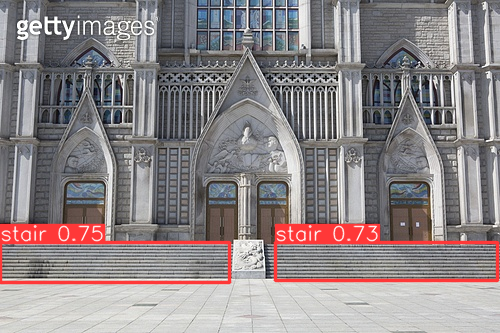

In [15]:
image_path = "./test2.jpg"
image = plt.imread(image_path)
results = model(image)
results.show()

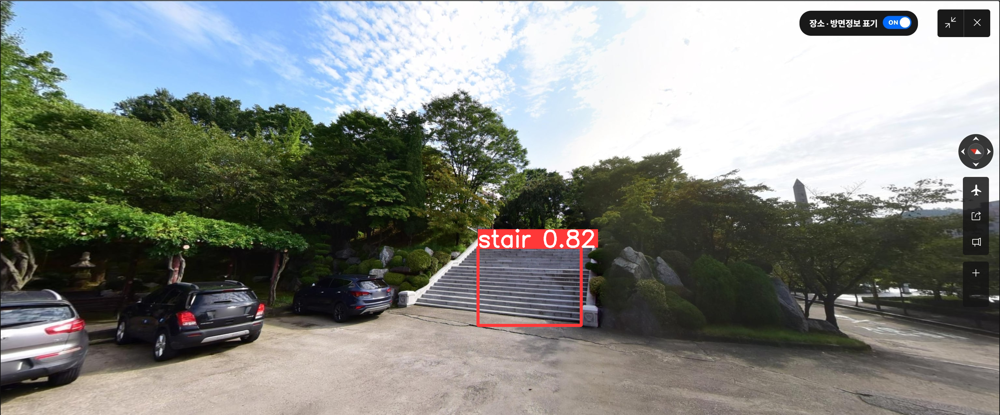

In [16]:
image_path = "./061848.jpg"
image = plt.imread(image_path)
results = model(image)
results.show()

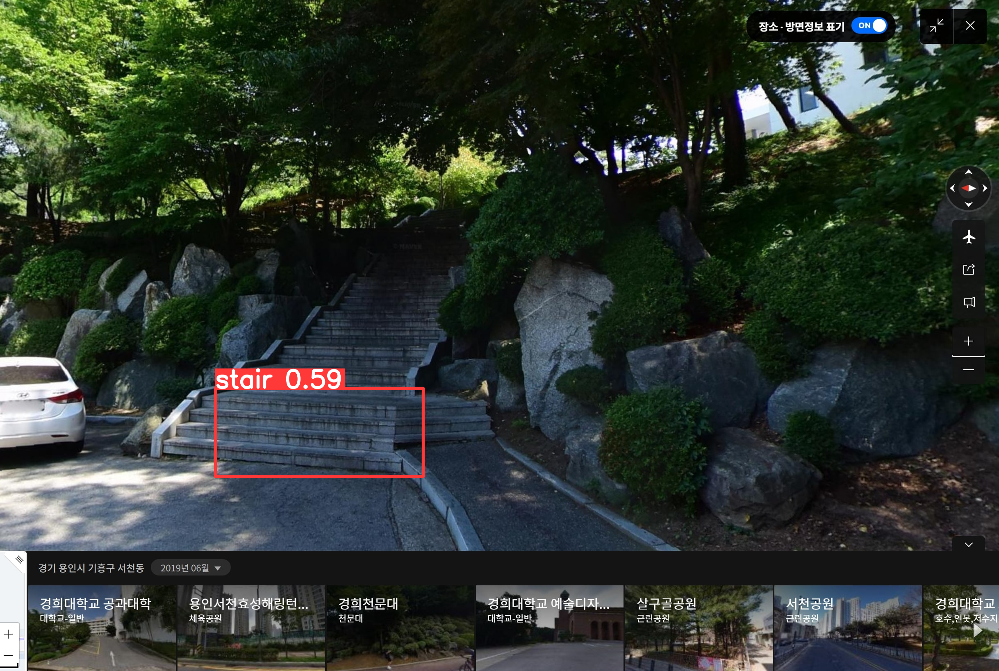

In [17]:
image_path = "./062327.jpg"
image = plt.imread(image_path)
results = model(image)
results.show()